In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import bar_chart_race as bcr

In [5]:
dff1 = pd.read_csv(r"C:\Users\psath\Downloads\Untitled Folder 6\dataset.csv", skipinitialspace=True)

In [9]:
dff1.rename(columns = {'Postal Code':'Postal_Code', 'Model Year':'Model_Year','Electric Vehicle Type':'Electric_Vehicle_Type','Clean Alternative Fuel Vehicle (CAFV) Eligibility':'Clean_Alternative_Fuel_Vehicle(CAFV)Eligibility','Electric Range':'Electric_Range','Base MSRP':'Base_MSRP','Legislative District':'Legislative_District','DOL Vehicle ID':'DOL_Vehicle_ID','Vehicle Location':'Vehicle_Location','Electric Utility':'Electric_Utility','2020 Census Tract':'2020_Census_Tract'}, inplace = True)

In [10]:
dff1.rename(columns = {'VIN (1-10)':'VIN from 1-10'}, inplace = True)

In [11]:
dff1.rename(columns = {'VIN (1-10)':'VINfrom1-10'}, inplace = True)

In [12]:
dff1.rename(columns = {'2020_Census_Tract':'Census_Tract'}, inplace = True)

In [13]:
dff1

,VIN from 1-10,County,City,State,Postal_Code,Model_Year,Make,Model,Electric_Vehicle_Type,Clean_Alternative_Fuel_Vehicle(CAFV)Eligibility,Electric_Range,Base_MSRP,Legislative_District,DOL_Vehicle_ID,Vehicle_Location,Electric_Utility,Census_Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [14]:
dff1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                           Non-Null Count   Dtype  
---  ------                                           --------------   -----  
 0   VIN from 1-10                                    112634 non-null  object 
 1   County                                           112634 non-null  object 
 2   City                                             112634 non-null  object 
 3   State                                            112634 non-null  object 
 4   Postal_Code                                      112634 non-null  int64  
 5   Model_Year                                       112634 non-null  int64  
 6   Make                                             112634 non-null  object 
 7   Model                                            112614 non-null  object 
 8   Electric_Vehicle_Type                            112634 non-null  object 
 9   Clean_Alternati

In [15]:
dff1.isna().sum()

VIN from 1-10                                        0
County                                               0
City                                                 0
State                                                0
Postal_Code                                          0
Model_Year                                           0
Make                                                 0
Model                                               20
Electric_Vehicle_Type                                0
Clean_Alternative_Fuel_Vehicle(CAFV)Eligibility      0
Electric_Range                                       0
Base_MSRP                                            0
Legislative_District                               286
DOL_Vehicle_ID                                       0
Vehicle_Location                                    24
Electric_Utility                                   443
Census_Tract                                         0
dtype: int64

In [16]:
dff1.Electric_Utility.value_counts()
dff1.Electric_Utility.mode()
dff1.Electric_Utility.mode().values
eu_mode=dff1.Electric_Utility.mode().values[0]
dff1.Electric_Utility.fillna(eu_mode, inplace=True)
dff1.Electric_Utility.isna().sum()

0

In [17]:
dff1.Vehicle_Location.value_counts()
dff1.Vehicle_Location.mode()
dff1.Vehicle_Location.mode().values
vl_mode=dff1.Vehicle_Location.mode().values[0]
dff1.Vehicle_Location.fillna(vl_mode, inplace=True)
dff1.Vehicle_Location.isna().sum()

0

In [18]:
dff1.Model.value_counts()
dff1.Model.mode()
dff1.Model.mode().values
mod_mode=dff1.Model.mode().values[0]
dff1.Model.fillna(mod_mode, inplace=True)
dff1.Model.isna().sum()

0

In [19]:
dff1.isna().sum()

VIN from 1-10                                        0
County                                               0
City                                                 0
State                                                0
Postal_Code                                          0
Model_Year                                           0
Make                                                 0
Model                                                0
Electric_Vehicle_Type                                0
Clean_Alternative_Fuel_Vehicle(CAFV)Eligibility      0
Electric_Range                                       0
Base_MSRP                                            0
Legislative_District                               286
DOL_Vehicle_ID                                       0
Vehicle_Location                                     0
Electric_Utility                                     0
Census_Tract                                         0
dtype: int64

In [20]:
dff1.Legislative_District = dff1.Legislative_District.fillna(dff1.Legislative_District.median())

In [21]:
dff1.head(20)

,VIN from 1-10,County,City,State,Postal_Code,Model_Year,Make,Model,Electric_Vehicle_Type,Clean_Alternative_Fuel_Vehicle(CAFV)Eligibility,Electric_Range,Base_MSRP,Legislative_District,DOL_Vehicle_ID,Vehicle_Location,Electric_Utility,Census_Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,34.0,198968248,POINT (-81.80023 24.5545),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,5204412,POINT (-114.57245 35.16815),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900
7,1N4AZ0CP0D,Snohomish,Mukilteo,WA,98275,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,21.0,176817364,POINT (-122.29196 47.89908),PUGET SOUND ENERGY INC,53061042001
8,1N4BZ0CP4G,Island,Clinton,WA,98236,2016,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,0,10.0,475900379,POINT (-122.35803 47.9796),PUGET SOUND ENERGY INC,53029972100
9,KNDJP3AE2G,Skagit,Anacortes,WA,98221,2016,KIA,SOUL,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,93,31950,40.0,100489049,POINT (-122.61214 48.51748),PUGET SOUND ENERGY INC,53057940301


In [22]:
dff1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                           Non-Null Count   Dtype  
---  ------                                           --------------   -----  
 0   VIN from 1-10                                    112634 non-null  object 
 1   County                                           112634 non-null  object 
 2   City                                             112634 non-null  object 
 3   State                                            112634 non-null  object 
 4   Postal_Code                                      112634 non-null  int64  
 5   Model_Year                                       112634 non-null  int64  
 6   Make                                             112634 non-null  object 
 7   Model                                            112634 non-null  object 
 8   Electric_Vehicle_Type                            112634 non-null  object 
 9   Clean_Alternati

In [24]:
from scipy.stats import skew

In [25]:
dff1.skew(axis = 0, skipna = True)

C:\Users\psath\AppData\Local\Temp\ipykernel_21772\56591691.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  dff1.skew(axis = 0, skipna = True)


Postal_Code            -27.955285
Model_Year              -0.817579
Electric_Range           0.817103
Base_MSRP               10.100497
Legislative_District    -0.544960
DOL_Vehicle_ID           1.149258
Census_Tract           -25.013927
dtype: float64

<AxesSubplot:>

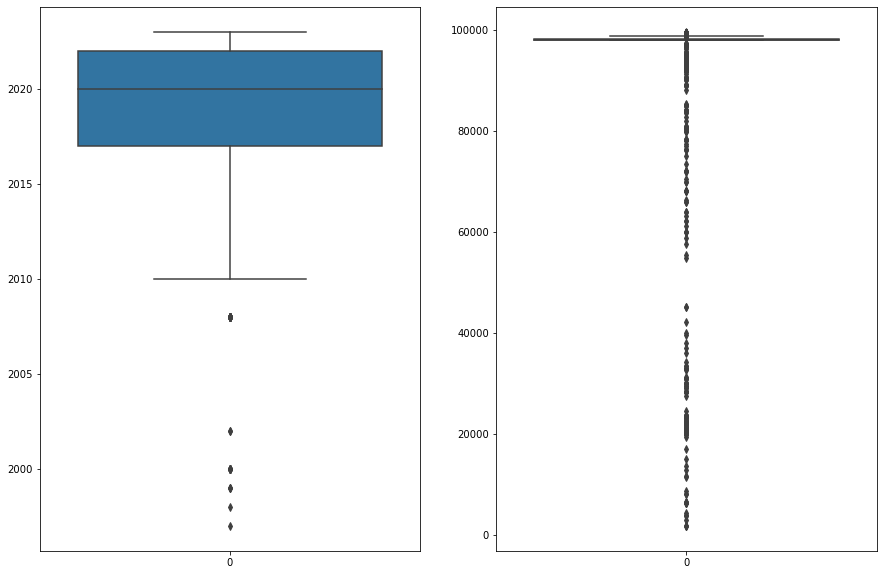

In [26]:
plt.figure(figsize=(15,10))

plt.subplot(121)
sns.boxplot(dff1.Model_Year)
plt.subplot(122)
sns.boxplot(dff1.Postal_Code)

**In this Model_year and Postal_Code are having outliers but we are not removing it is very important for our data**

<AxesSubplot:>

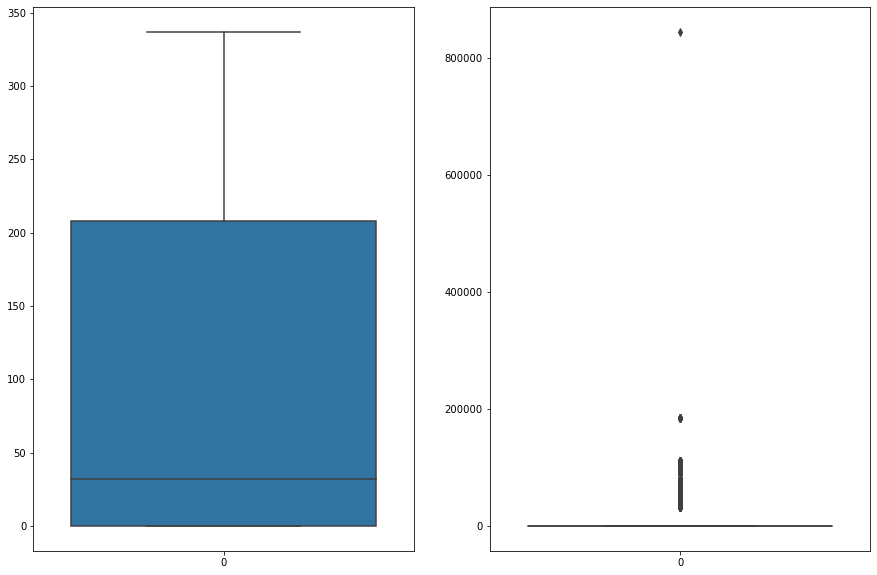

In [27]:
plt.figure(figsize=(15,10))
plt.subplot(121)
sns.boxplot(dff1.Electric_Range)
plt.subplot(122)
sns.boxplot(dff1.Base_MSRP)


<AxesSubplot:>

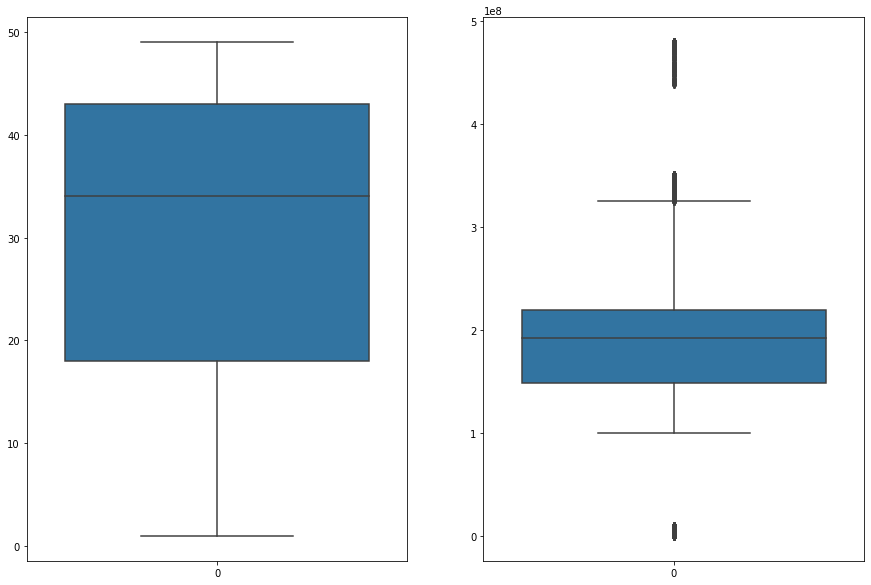

In [28]:
plt.figure(figsize=(15,10))
plt.subplot(121)
sns.boxplot(dff1.Legislative_District)
plt.subplot(122)
sns.boxplot(dff1.DOL_Vehicle_ID)


<AxesSubplot:>

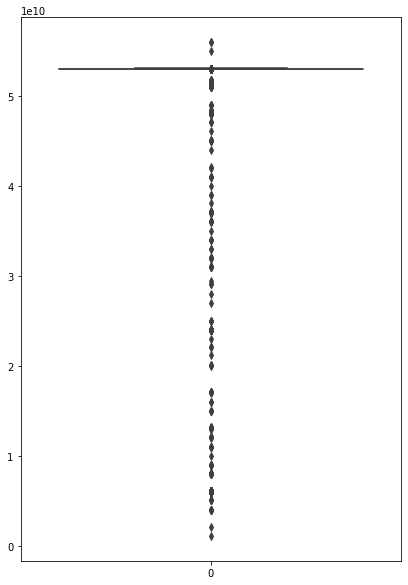

In [29]:
plt.figure(figsize=(15,10))
plt.subplot(121)
sns.boxplot(dff1.Census_Tract)

Skewness after Log Transformation: 5.403248956479105


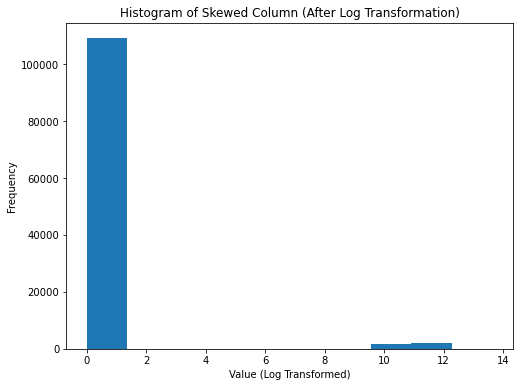

In [30]:
dff1.Base_MSRP = np.log1p(dff1.Base_MSRP)

# Check the skewness after transformation
skewness_after_transform = dff1.Base_MSRP.skew()
print("Skewness after Log Transformation:", skewness_after_transform)

# Visualize the data distribution after transformation
plt.figure(figsize=(8, 6))
plt.hist(dff1.Base_MSRP, bins=10)
plt.title("Histogram of Skewed Column (After Log Transformation)")
plt.xlabel("Value (Log Transformed)")
plt.ylabel("Frequency")
plt.show()

In [31]:
dff1.skew(axis = 0, skipna = True)

C:\Users\psath\AppData\Local\Temp\ipykernel_21772\56591691.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  dff1.skew(axis = 0, skipna = True)


Postal_Code            -27.955285
Model_Year              -0.817579
Electric_Range           0.817103
Base_MSRP                5.403249
Legislative_District    -0.544960
DOL_Vehicle_ID           1.149258
Census_Tract           -25.013927
dtype: float64

**After this we are going to perform Univariate, Bivariate and Multi variate**

In [35]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = dff1
import plotly.express as px

fig = px.choropleth(df, locations="Postal_Code",hover_name='Electric_Vehicle_Type',color='Make',scope='usa')
fig.show()